# Video Game Sales
data from more than 16,500 games.

## Importing Libraries

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')

RAND = 10

## Loading Data

In [68]:
videoGameData = pd.read_csv('../input/vgsales.csv', parse_dates=['Year'])

In [69]:
videoGameData.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006-01-01,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985-01-01,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008-01-01,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009-01-01,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996-01-01,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


### About Dataset
This dataset contains a list of video games with sales greater than 100,000 copies. It was generated by a scrape of vgchartz.com.

Fields include

* Rank - Ranking of overall sales

* Name - The games name

* Platform - Platform of the games release (i.e. PC,PS4, etc.)

* Year - Year of the game's release

* Genre - Genre of the game

* Publisher - Publisher of the game

* NA_Sales - Sales in North America (in millions)

* EU_Sales - Sales in Europe (in millions)

* JP_Sales - Sales in Japan (in millions)

* Other_Sales - Sales in the rest of the world (in millions)

* Global_Sales - Total worldwide sales.

The script to scrape the data is available at https://github.com/GregorUT/vgchartzScrape.

In [70]:
videoGameData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Rank          16598 non-null  int64         
 1   Name          16598 non-null  object        
 2   Platform      16598 non-null  object        
 3   Year          16327 non-null  datetime64[ns]
 4   Genre         16598 non-null  object        
 5   Publisher     16540 non-null  object        
 6   NA_Sales      16598 non-null  float64       
 7   EU_Sales      16598 non-null  float64       
 8   JP_Sales      16598 non-null  float64       
 9   Other_Sales   16598 non-null  float64       
 10  Global_Sales  16598 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(4)
memory usage: 1.4+ MB


In [71]:
videoGameData.describe()

,Rank,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000
mean,8300.605254,0.264667,0.146652,0.077782,0.048063,0.537441
std,4791.853933,0.816683,0.505351,0.309291,0.188588,1.555028
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4151.250000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8300.500000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12449.750000,0.240000,0.110000,0.040000,0.040000,0.470000
max,16600.000000,41.490000,29.020000,10.220000,10.570000,82.740000


In [72]:
videoGameData.describe(include='object')

,Name,Platform,Genre,Publisher
count,16598,16598,16598,16540
unique,11493,31,12,578
top,Need for Speed: Most Wanted,DS,Action,Electronic Arts
freq,12,2163,3316,1351


<AxesSubplot:xlabel='Global_Sales', ylabel='Density'>

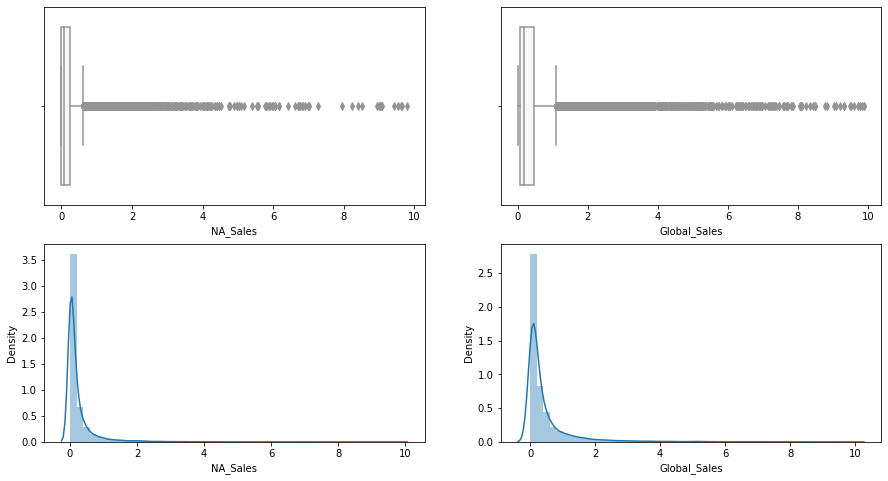

In [73]:
fig, ax = plt.subplots(2, 2, figsize=(15, 8))
sns.boxplot(videoGameData['NA_Sales'][videoGameData['NA_Sales']<10], palette='PRGn', ax = ax[0, 0])
sns.distplot(videoGameData['NA_Sales'][videoGameData['NA_Sales']<10], ax = ax[1, 0])
sns.boxplot(videoGameData['Global_Sales'][videoGameData['Global_Sales']<10], palette='PRGn', ax = ax[0, 1])
sns.distplot(videoGameData['Global_Sales'][videoGameData['Global_Sales']<10], ax = ax[1, 1])

## Data Preprocessing

In [74]:
videoGameData.isnull().sum()

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64

In [75]:
videoGameData.dropna(inplace=True)

In [76]:
videoGameData['Year'] = videoGameData['Year'].dt.to_period('Y')

In [77]:
videoGameData = videoGameData.drop(videoGameData['Global_Sales'].idxmax())

### Categorical Data

In [79]:
videoGameData['Genre'] = videoGameData['Genre'].astype('category')
videoGameData['Platform'] = videoGameData['Platform'].astype('category')
videoGameData['Publisher'] = videoGameData['Publisher'].astype('category')

#### Add categorical columns 

In [80]:
platformCatDict = dict( enumerate(videoGameData['Platform'].cat.categories ) )
genreCatDict = dict( enumerate(videoGameData['Genre'].cat.categories ) )

In [81]:
# videoGameData['Genre_cat'] = videoGameData['Genre'].cat.codes.astype('int')
videoGameData['Platform_cat'] = videoGameData['Platform'].cat.codes.astype('int')
videoGameData['Publisher_cat'] = videoGameData['Publisher'].cat.codes.astype('int')

#### Name id

In [82]:
videoGameData['Name_id'] = videoGameData['Name'].astype('category')
nameIDDict = dict( enumerate(videoGameData['Name_id'].cat.categories ) )
videoGameData['Name_id'] = videoGameData['Name_id'].cat.codes.astype('int')
videoGameData.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Platform_cat,Publisher_cat,Name_id
1,2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,11,359,9201
2,3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,26,359,5493
3,4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,26,359,10850
4,5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,5,359,7247
5,6,Tetris,GB,1989,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,5,359,9581


## Data Exploration and Analysis

Text(0, 0.5, 'Count')

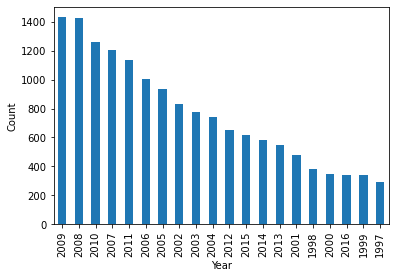

In [83]:
videoGameData['Year'].value_counts()[:20].plot(kind='bar')
plt.xlabel('Year')
plt.ylabel('Count')

Text(0.5, 0, 'Genre')

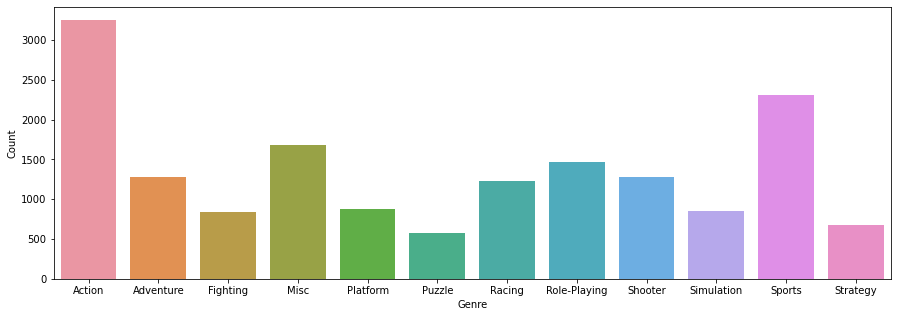

In [84]:
plt.figure(figsize=(15, 5))
sns.countplot(videoGameData['Genre'])
plt.ylabel('Count')
plt.xlabel('Genre')

Text(0.5, 0, 'Platform')

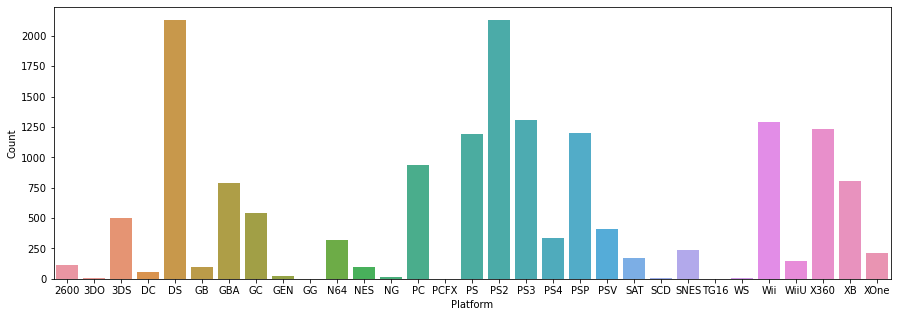

In [85]:
plt.figure(figsize=(15, 5))
sns.countplot(videoGameData['Platform'])
plt.ylabel('Count')
plt.xlabel('Platform')

Text(0, 0.5, 'Global sales')

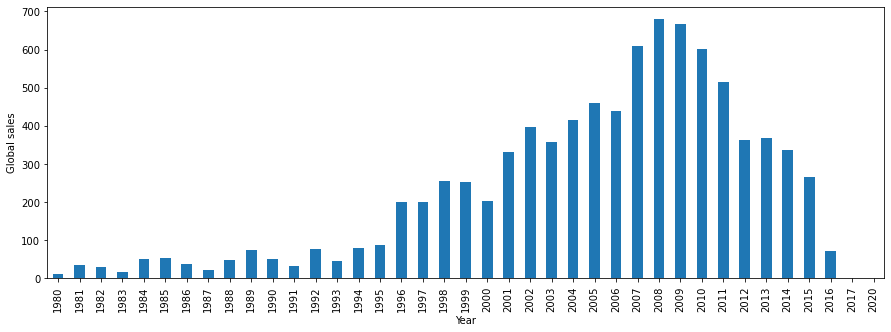

In [86]:
plt.figure(figsize=(15, 5))
videoGameData.groupby(by=['Year'])['Global_Sales'].sum().plot(kind='bar')
plt.ylabel('Global sales')

Text(0, 0.5, 'Global sales')

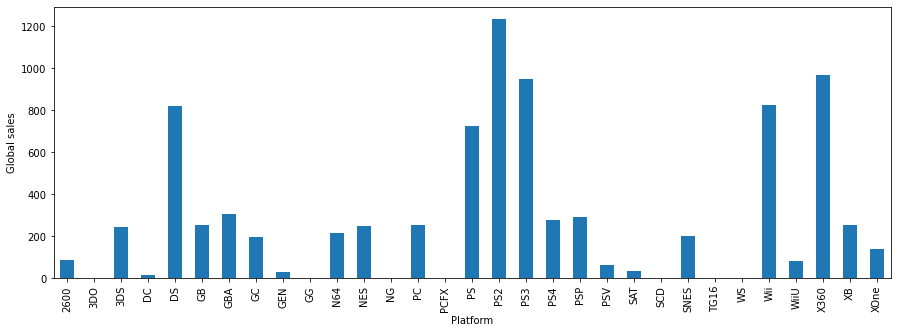

In [87]:
plt.figure(figsize=(15, 5))
videoGameData.groupby(by=['Platform'])['Global_Sales'].sum().plot(kind='bar')
plt.ylabel('Global sales')

Text(0, 0.5, 'Global sales')

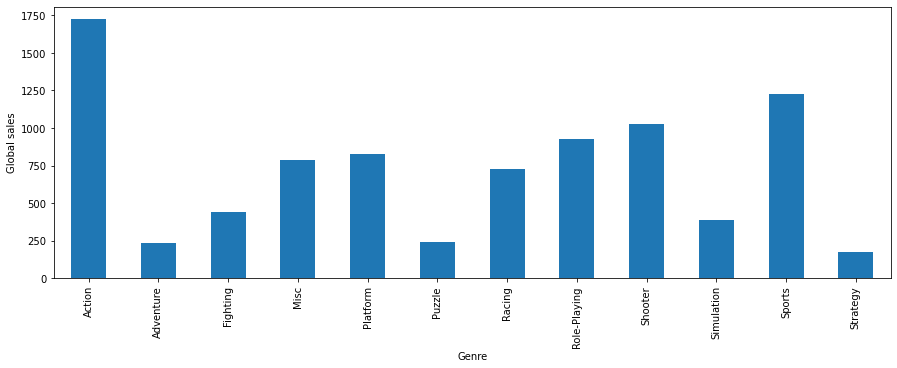

In [88]:
plt.figure(figsize=(15, 5))
videoGameData.groupby(by=['Genre'])['Global_Sales'].sum().plot(kind='bar')
plt.ylabel('Global sales')

<AxesSubplot:>

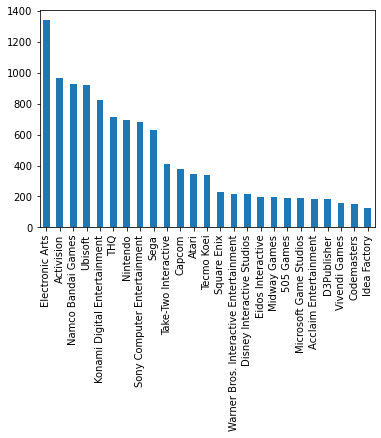

In [89]:
videoGameData['Publisher'].value_counts()[:25].plot(kind='bar')

Text(0, 0.5, 'Total Sales')

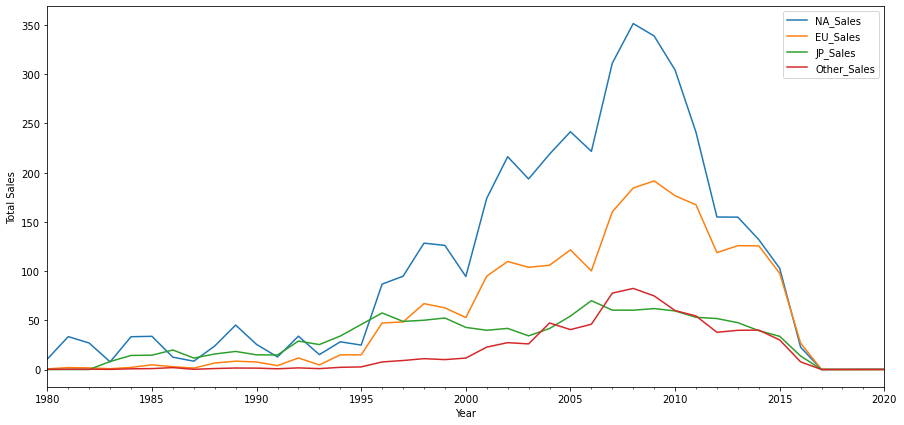

In [90]:
salesPerYear = videoGameData.loc[:, ['Year', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']].groupby(by =  'Year'  ).sum()
salesPerYear.plot(figsize=(15, 7))
plt.ylabel('Total Sales')

## Correlation Heatmap

Text(0.5, 1.0, 'Correlation Heatmap')

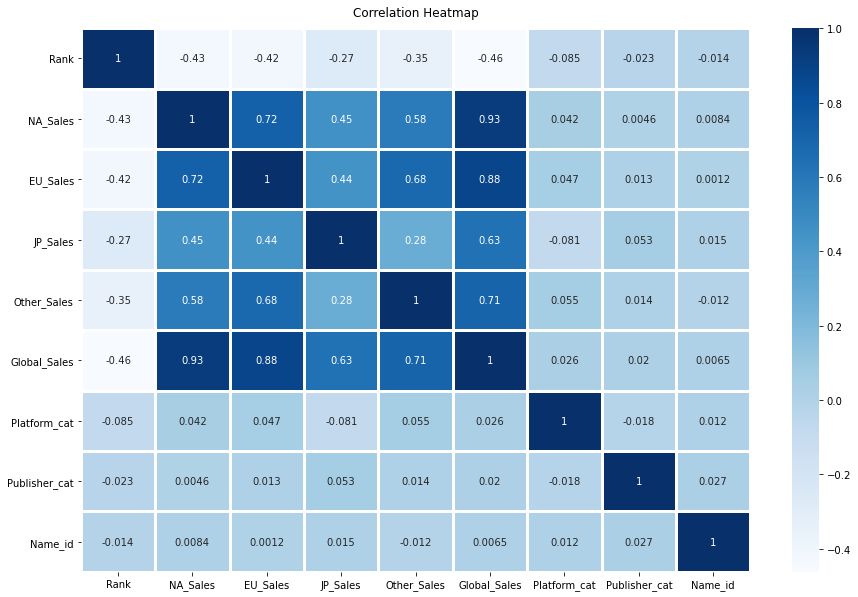

In [91]:
plt.figure(figsize=(15,10))
heatmap = sns.heatmap(videoGameData.corr(), cmap = "Blues", annot=True, linewidth=3)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

## Modeling

In [92]:
dataLabels = pd.get_dummies(videoGameData, columns=['Genre'])
dataLabels['Year'] = dataLabels['Year'].astype('int')
dataLabels = dataLabels.drop(columns=['Name', 'Publisher', 'Platform'], axis=1)

In [93]:
dataLabels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16290 entries, 1 to 16597
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rank                16290 non-null  int64  
 1   Year                16290 non-null  int64  
 2   NA_Sales            16290 non-null  float64
 3   EU_Sales            16290 non-null  float64
 4   JP_Sales            16290 non-null  float64
 5   Other_Sales         16290 non-null  float64
 6   Global_Sales        16290 non-null  float64
 7   Platform_cat        16290 non-null  int32  
 8   Publisher_cat       16290 non-null  int32  
 9   Name_id             16290 non-null  int32  
 10  Genre_Action        16290 non-null  uint8  
 11  Genre_Adventure     16290 non-null  uint8  
 12  Genre_Fighting      16290 non-null  uint8  
 13  Genre_Misc          16290 non-null  uint8  
 14  Genre_Platform      16290 non-null  uint8  
 15  Genre_Puzzle        16290 non-null  uint8  
 16  Genr

### PCA (Principal Component Analysis)

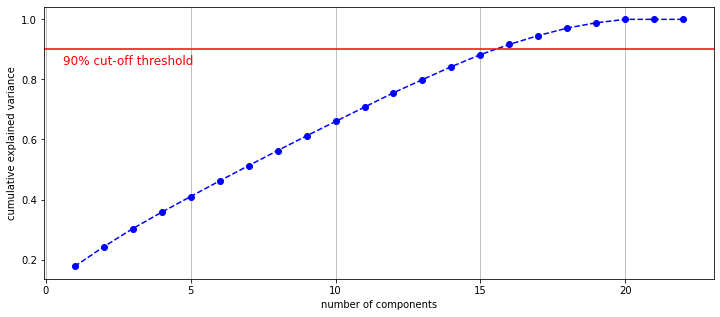

In [94]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X_scaled = StandardScaler().fit_transform(dataLabels)

pca = PCA().fit(X_scaled)

plt.figure(figsize=(12, 5))
x = np.arange(1, len(pca.explained_variance_ratio_)+1, 1)
plt.plot(x, np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--', color='b')
plt.axhline(y=0.9, color='r', linestyle='-')
plt.text(0.6, 0.85, '90% cut-off threshold', color = 'red', fontsize=12)
plt.grid(axis='x')

plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [95]:
import plotly.express as px
pca = PCA(n_components=13).fit(X_scaled)

components = pca.fit_transform(X_scaled)
total_var = pca.explained_variance_ratio_.sum() * 100
n_components = len(pca.explained_variance_ratio_)

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Median Price'
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(marker_size=1, diagonal_visible=False)

fig.update_layout(
    font=dict(size=5, color='black'),
    autosize=False,
    width=1000,
    height=1000,
)

In [112]:
X_scaled = StandardScaler().fit_transform(dataLabels)

pca = PCA(n_components=0.9, random_state=RAND)
X_embedding_pca = pca.fit_transform(X_scaled)

pca_3 = PCA(n_components=13, random_state=RAND)
X_embedding_pca_3 = pca_3.fit_transform(X_scaled)

fig = px.scatter_3d(
    X_embedding_pca, x=3, y=7, z=12,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)

### KMeans

  0%|          | 0/10 [00:00<?, ?it/s]

2 clusters
----------------------------------------------------------------------------------------------------


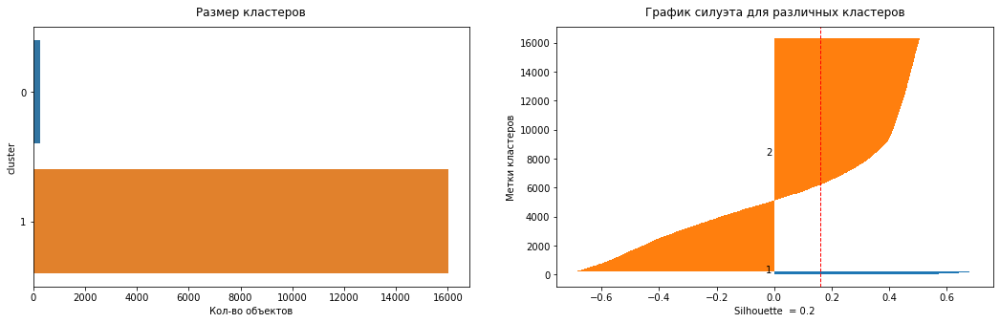

3 clusters
----------------------------------------------------------------------------------------------------


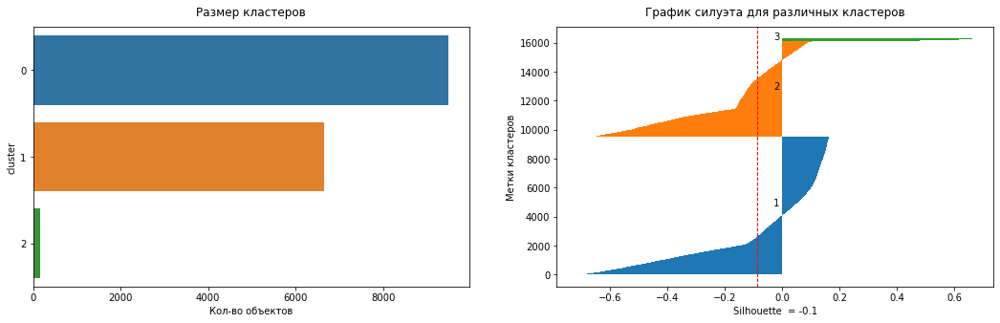

4 clusters
----------------------------------------------------------------------------------------------------


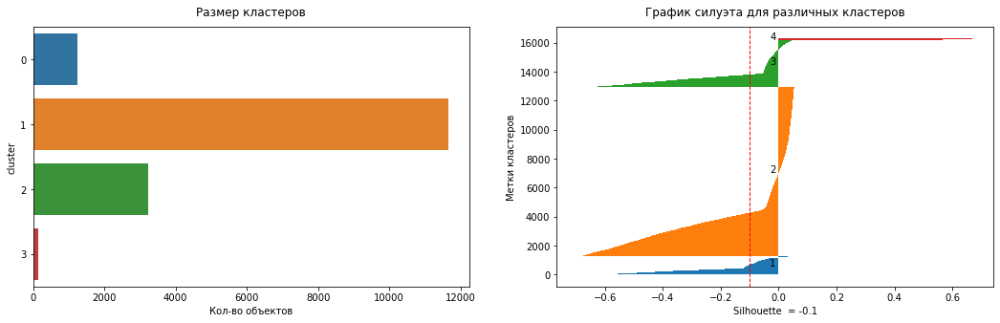

5 clusters
----------------------------------------------------------------------------------------------------


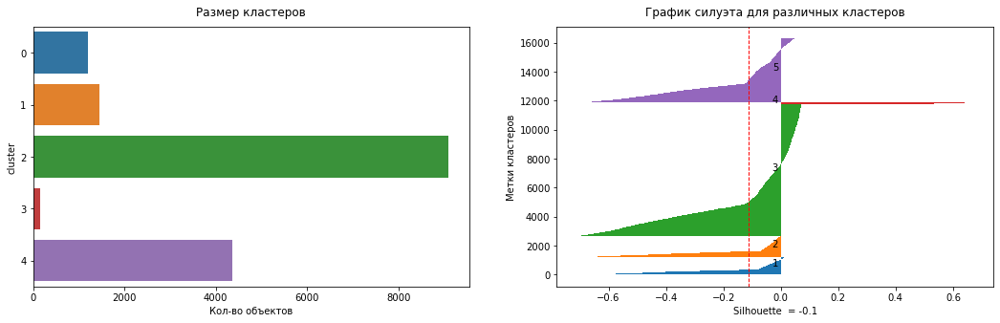

6 clusters
----------------------------------------------------------------------------------------------------


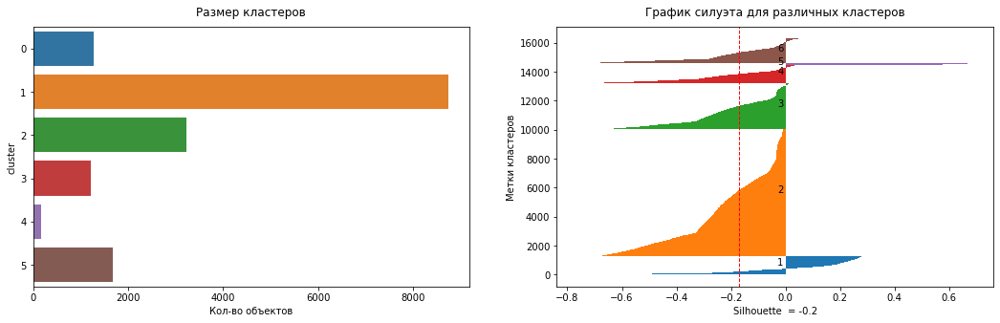

7 clusters
----------------------------------------------------------------------------------------------------


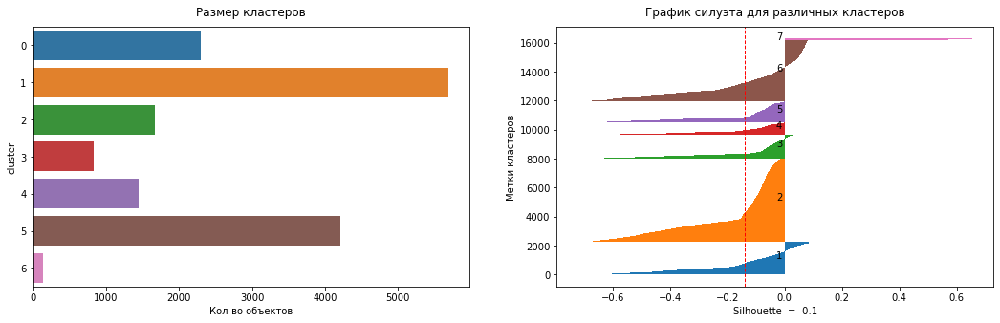

8 clusters
----------------------------------------------------------------------------------------------------


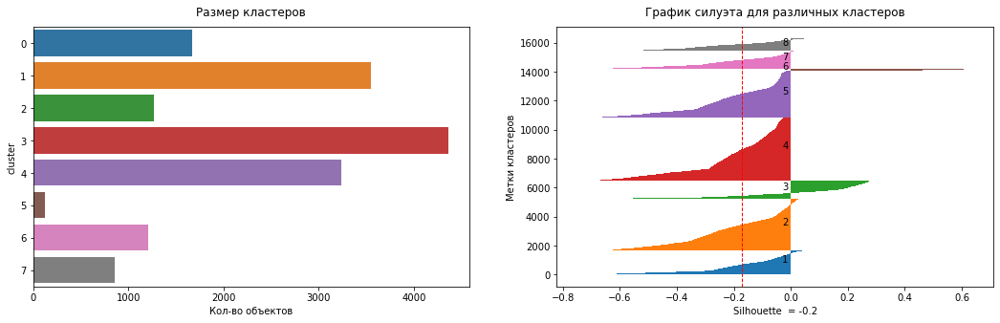

9 clusters
----------------------------------------------------------------------------------------------------


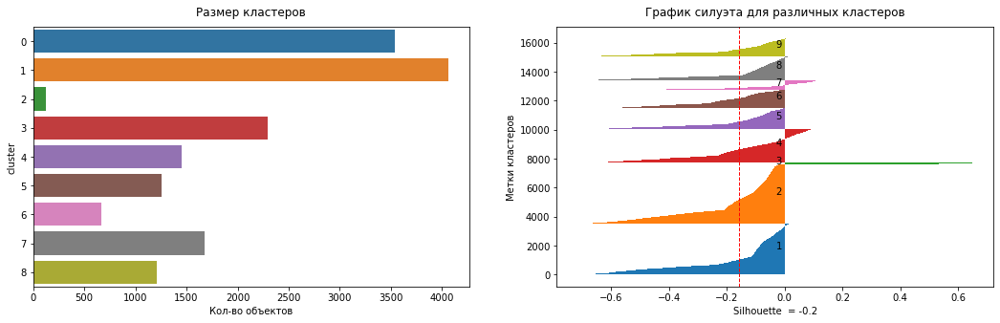

10 clusters
----------------------------------------------------------------------------------------------------


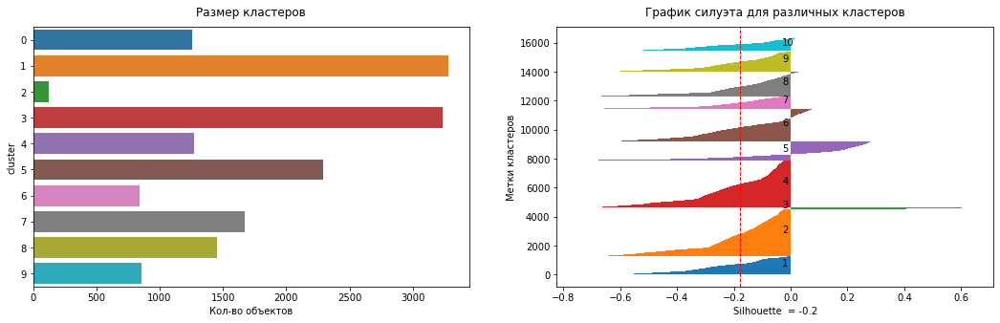

11 clusters
----------------------------------------------------------------------------------------------------


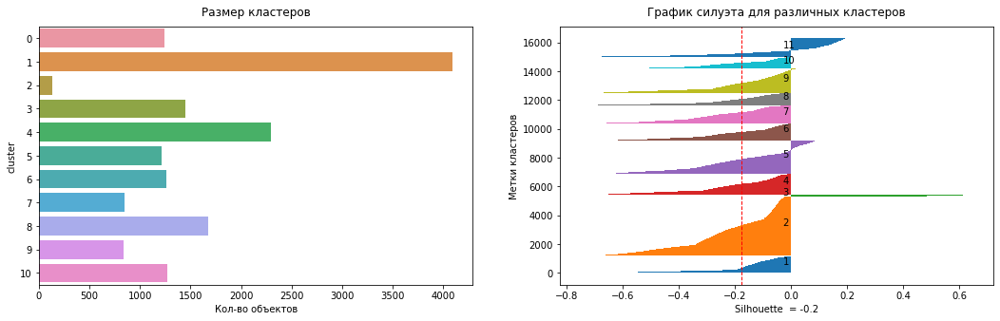

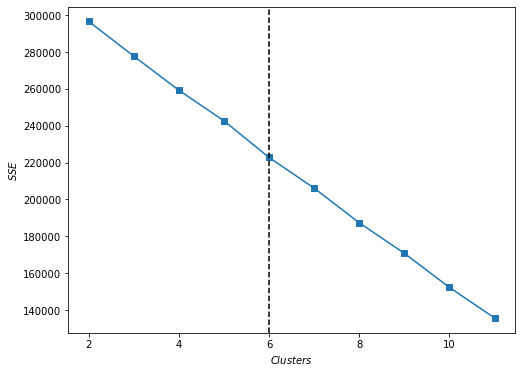

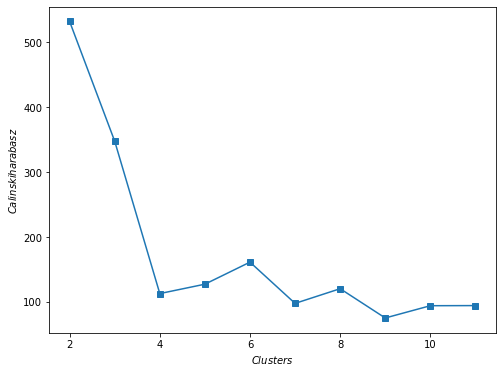

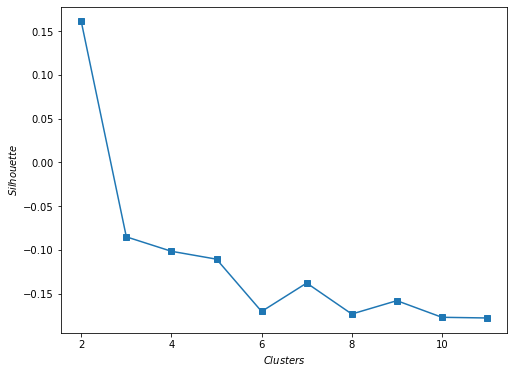

In [97]:
from sklearn.cluster import SpectralClustering, KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from utils import plotting_object, plotting_kde_num, plot_clustering, plotting_num, plot_size, silhouette_plot
params_cluster = {
    'KMeans': {
        'random_state': RAND,
    },
    'SpectralClustering': {
        'random_state': RAND,
        'affinity': 'nearest_neighbors',
        'n_neighbors': 25,
        'n_jobs': -1
    },
    'AgglomerativeClustering': {
    }
}
dict_clusters_km = plot_clustering(data=dataLabels,
                                   data_scale=X_scaled,
                                   embedding=X_embedding_pca,
                                   kwargs=params_cluster['KMeans'],
                                   model=KMeans,
                                   type_train='embedding')

In [98]:
videoGameData['Genre_cat'] = videoGameData['Genre'].cat.codes.astype('int')
videoGameData['Platform_cat'] = videoGameData['Platform'].cat.codes.astype('int')
videoGameData['Year'] = videoGameData['Year'].astype('int')
num_cols = [
    'Year',
    'NA_Sales',
    'EU_Sales',
    'JP_Sales',
    'Global_Sales',
    'Publisher_cat',
    'Genre_cat',
    'Platform_cat'
]

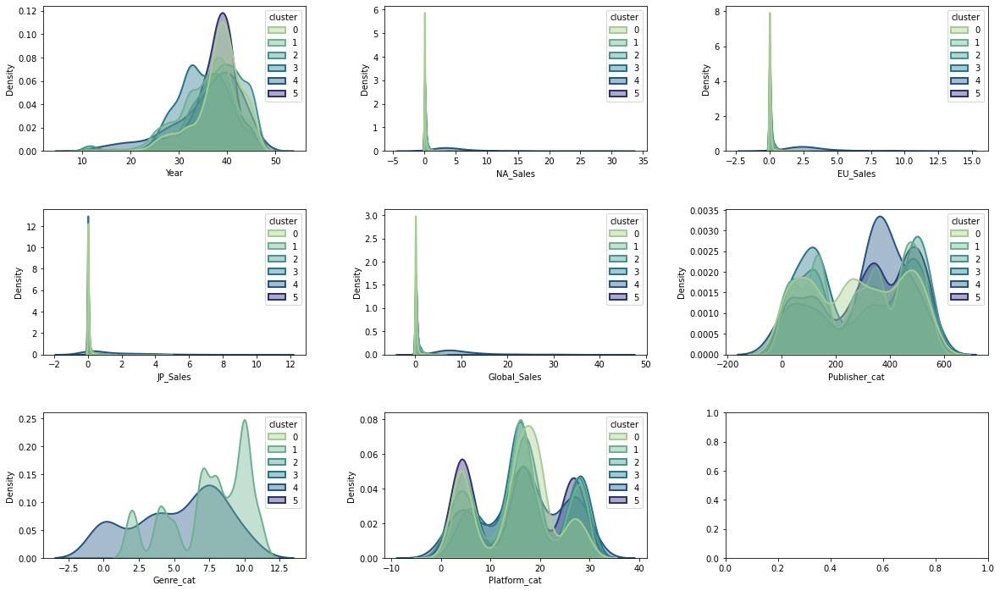

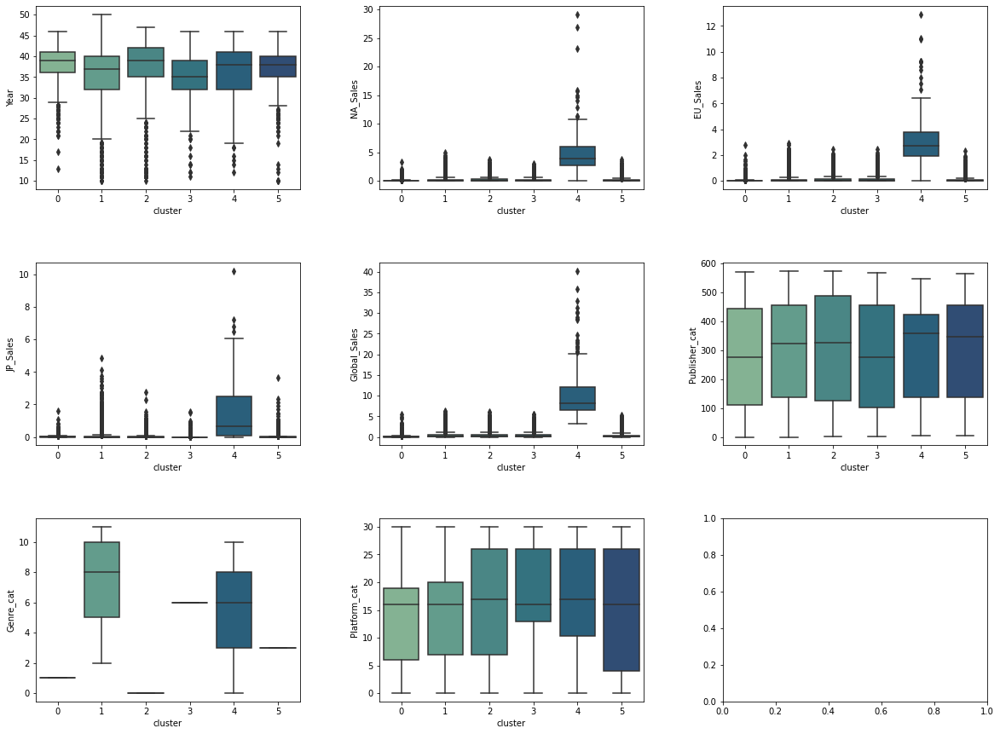

In [107]:
plotting_kde_num(videoGameData, dict_clusters_km[6], num_cols)
plotting_num(videoGameData, dict_clusters_km[6], num_cols)

In [110]:
fig = px.scatter_3d(
    X_embedding_pca, x=3, y=7, z=12,
    labels={'color': 'species'},
    color=dict_clusters_km[6]
)
fig.update_traces(marker_size=2)

<AxesSubplot:>

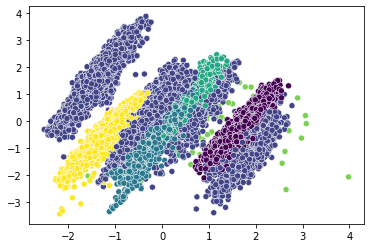

In [111]:
sns.scatterplot(X_embedding_pca[:,7], X_embedding_pca[:,12], c=dict_clusters_km[6])

## t-statistic

In [114]:
videoGameDataClus = videoGameData.copy()

In [115]:
videoGameDataClus['cluster'] = dict_clusters_km[6]

In [117]:
clusterSdt = []
for i in set(dict_clusters_km[6]):
    clusterSdt.append(videoGameDataClus[videoGameDataClus['cluster'] == i]['Global_Sales'].std())
print('std:')
for c, n in enumerate(clusterSdt):
    print(f'cluster {c} - {n}')

std:
cluster 0 - 0.40755030967002864
cluster 1 - 0.7342628986574822
cluster 2 - 0.7345409022553152
cluster 3 - 0.6965895946825754
cluster 4 - 6.764553822890468
cluster 5 - 0.6520131526496947


<AxesSubplot:xlabel='cluster', ylabel='Global_Sales'>

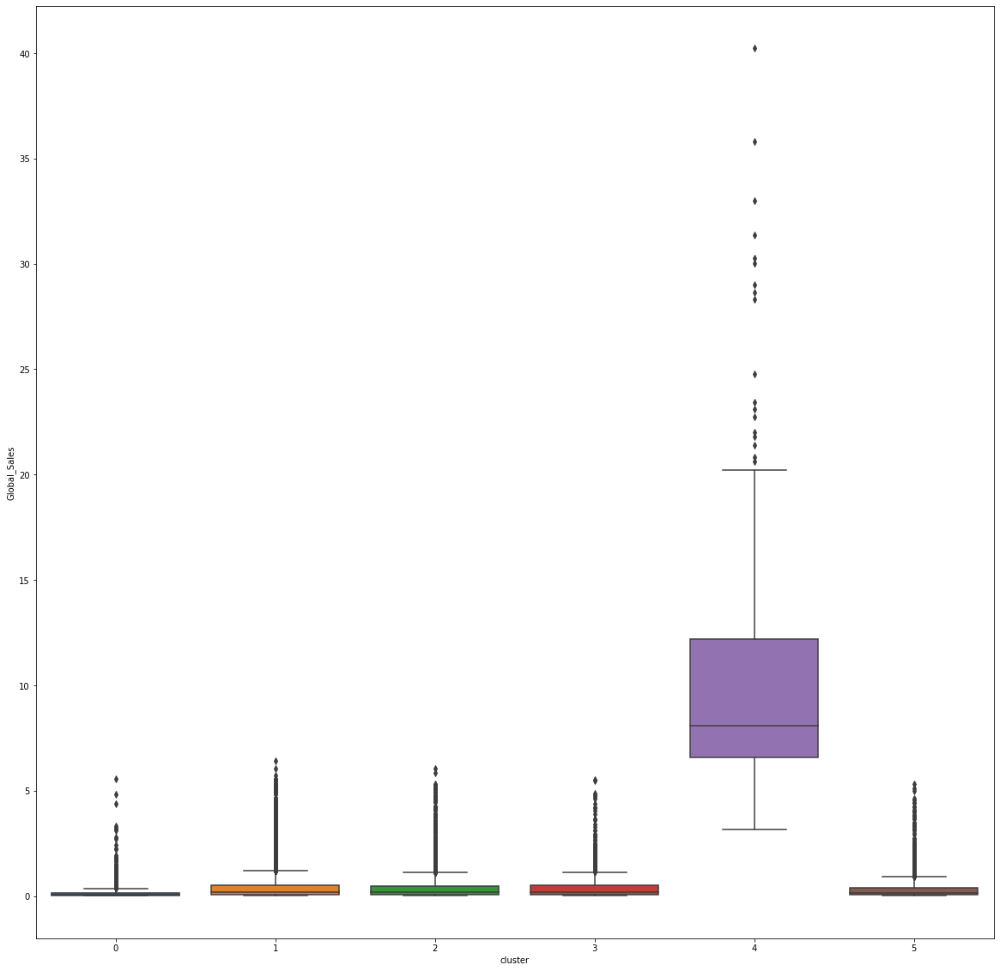

In [120]:
plt.figure(figsize=(20, 20))
sns.boxplot(x='cluster', y='Global_Sales', data=videoGameDataClus)

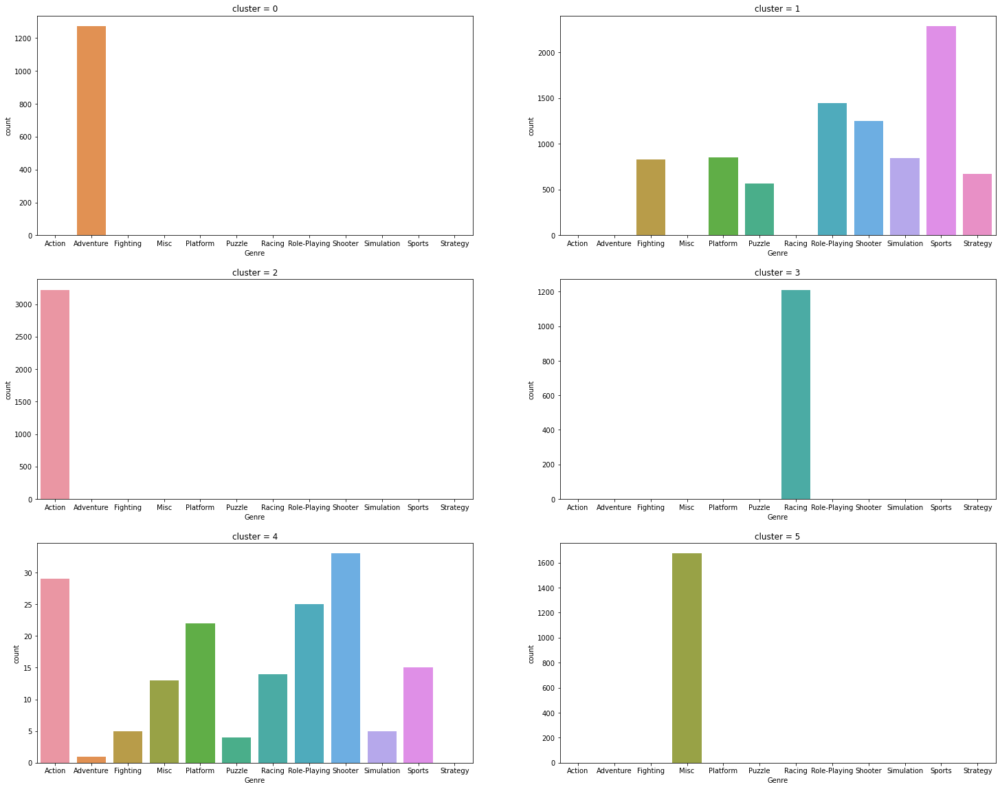

In [139]:
fig, ax = plt.subplots(3, 2, figsize=(25, 20))
for i, ax in zip(set(dict_clusters_km[6]), ax.ravel()):
    plt.title(i)
    sns.countplot(videoGameDataClus[videoGameDataClus['cluster'] == i]['Genre'], ax = ax).set(title=f'cluster = {i}')